In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns



In [2]:
# Load the dataset
air_quality = pd.read_csv("/content/AirQualityUCI.csv", sep=";", decimal=",")


In [3]:
# Display the first few rows of the dataset
air_quality.head()

,Date,Time,CO(GT),PT08.S1(CO),NMHC(GT),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH,Unnamed: 15,Unnamed: 16
0,10/03/2004,18.00.00,2.6,1360.0,150.0,11.9,1046.0,166.0,1056.0,113.0,1692.0,1268.0,13.6,48.9,0.7578,NaN,NaN
1,10/03/2004,19.00.00,2.0,1292.0,112.0,9.4,955.0,103.0,1174.0,92.0,1559.0,972.0,13.3,47.7,0.7255,NaN,NaN
2,10/03/2004,20.00.00,2.2,1402.0,88.0,9.0,939.0,131.0,1140.0,114.0,1555.0,1074.0,11.9,54.0,0.7502,NaN,NaN
3,10/03/2004,21.00.00,2.2,1376.0,80.0,9.2,948.0,172.0,1092.0,122.0,1584.0,1203.0,11.0,60.0,0.7867,NaN,NaN
4,10/03/2004,22.00.00,1.6,1272.0,51.0,6.5,836.0,131.0,1205.0,116.0,1490.0,1110.0,11.2,59.6,0.7888,NaN,NaN


In [4]:
# Display the summary of the dataset
air_quality.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9471 entries, 0 to 9470
Data columns (total 17 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Date           9357 non-null   object 
 1   Time           9357 non-null   object 
 2   CO(GT)         9357 non-null   float64
 3   PT08.S1(CO)    9357 non-null   float64
 4   NMHC(GT)       9357 non-null   float64
 5   C6H6(GT)       9357 non-null   float64
 6   PT08.S2(NMHC)  9357 non-null   float64
 7   NOx(GT)        9357 non-null   float64
 8   PT08.S3(NOx)   9357 non-null   float64
 9   NO2(GT)        9357 non-null   float64
 10  PT08.S4(NO2)   9357 non-null   float64
 11  PT08.S5(O3)    9357 non-null   float64
 12  T              9357 non-null   float64
 13  RH             9357 non-null   float64
 14  AH             9357 non-null   float64
 15  Unnamed: 15    0 non-null      float64
 16  Unnamed: 16    0 non-null      float64
dtypes: float64(15), object(2)
memory usage: 1.2+ MB


In [5]:
# Display the statistics of the dataset
air_quality.describe()

,CO(GT),PT08.S1(CO),NMHC(GT),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH,Unnamed: 15,Unnamed: 16
count,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,0.0,0.0
mean,-34.207524,1048.990061,-159.090093,1.865683,894.595276,168.616971,794.990168,58.148873,1391.479641,975.072032,9.778305,39.485380,-6.837604,NaN,NaN
std,77.657170,329.832710,139.789093,41.380206,342.333252,257.433866,321.993552,126.940455,467.210125,456.938184,43.203623,51.216145,38.976670,NaN,NaN
min,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,NaN,NaN
25%,0.600000,921.000000,-200.000000,4.000000,711.000000,50.000000,637.000000,53.000000,1185.000000,700.000000,10.900000,34.100000,0.692300,NaN,NaN
50%,1.500000,1053.000000,-200.000000,7.900000,895.000000,141.000000,794.000000,96.000000,1446.000000,942.000000,17.200000,48.600000,0.976800,NaN,NaN
75%,2.600000,1221.000000,-200.000000,13.600000,1105.000000,284.000000,960.000000,133.000000,1662.000000,1255.000000,24.100000,61.900000,1.296200,NaN,NaN
max,11.900000,2040.000000,1189.000000,63.700000,2214.000000,1479.000000,2683.000000,340.000000,2775.000000,2523.000000,44.600000,88.700000,2.231000,NaN,NaN


In [6]:
# Replace missing values with the mean of each column
air_quality = air_quality.replace(-200, np.nan)  # Assuming -200 is used for missing values
# air_quality = air_quality.fillna(air_quality.mean())

In [7]:
# Replace missing values with the mean of each numeric column
numeric_columns = air_quality.select_dtypes(include=[np.number]).columns
air_quality[numeric_columns] = air_quality[numeric_columns].fillna(air_quality[numeric_columns].mean())


In [8]:
# Verify that there are no more missing values in numeric columns
print(air_quality[numeric_columns].isnull().sum())


CO(GT)              0
PT08.S1(CO)         0
NMHC(GT)            0
C6H6(GT)            0
PT08.S2(NMHC)       0
NOx(GT)             0
PT08.S3(NOx)        0
NO2(GT)             0
PT08.S4(NO2)        0
PT08.S5(O3)         0
T                   0
RH                  0
AH                  0
Unnamed: 15      9471
Unnamed: 16      9471
dtype: int64


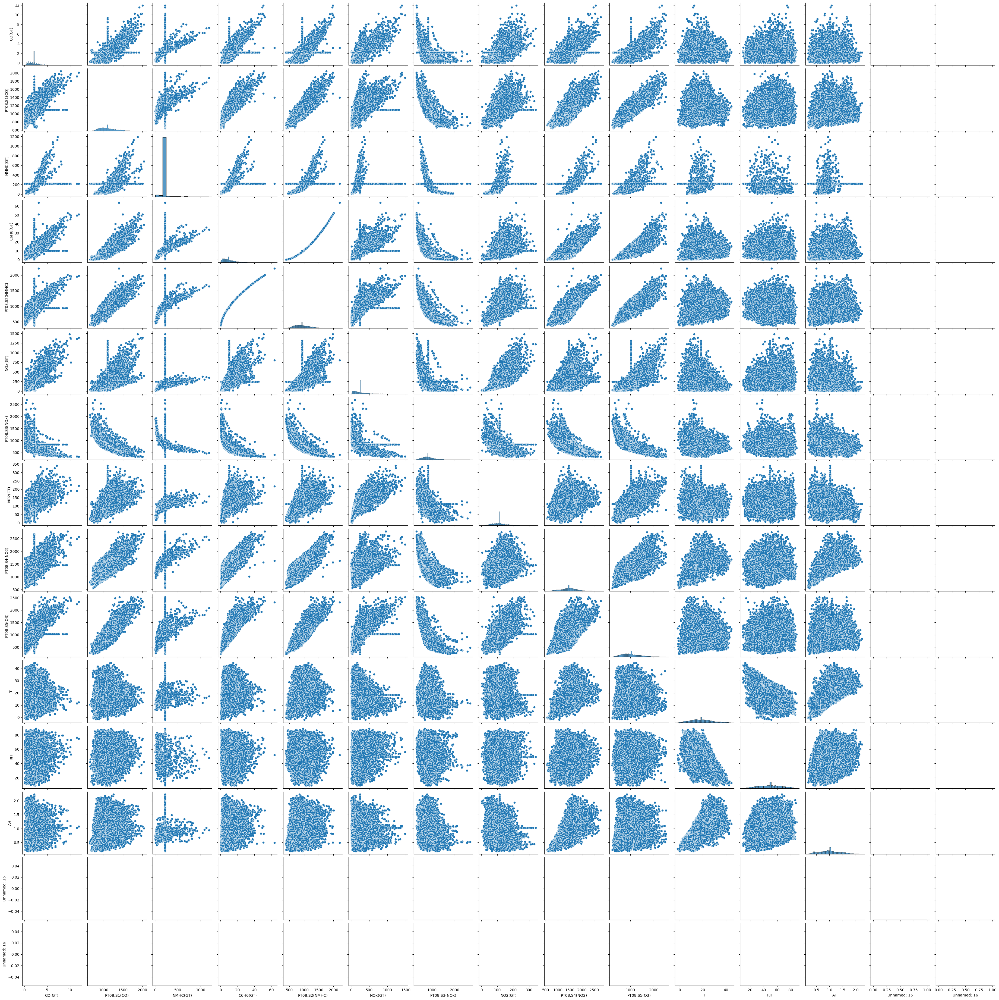

In [9]:

# Pairplot to visualize relationships
sns.pairplot(air_quality)
plt.show()


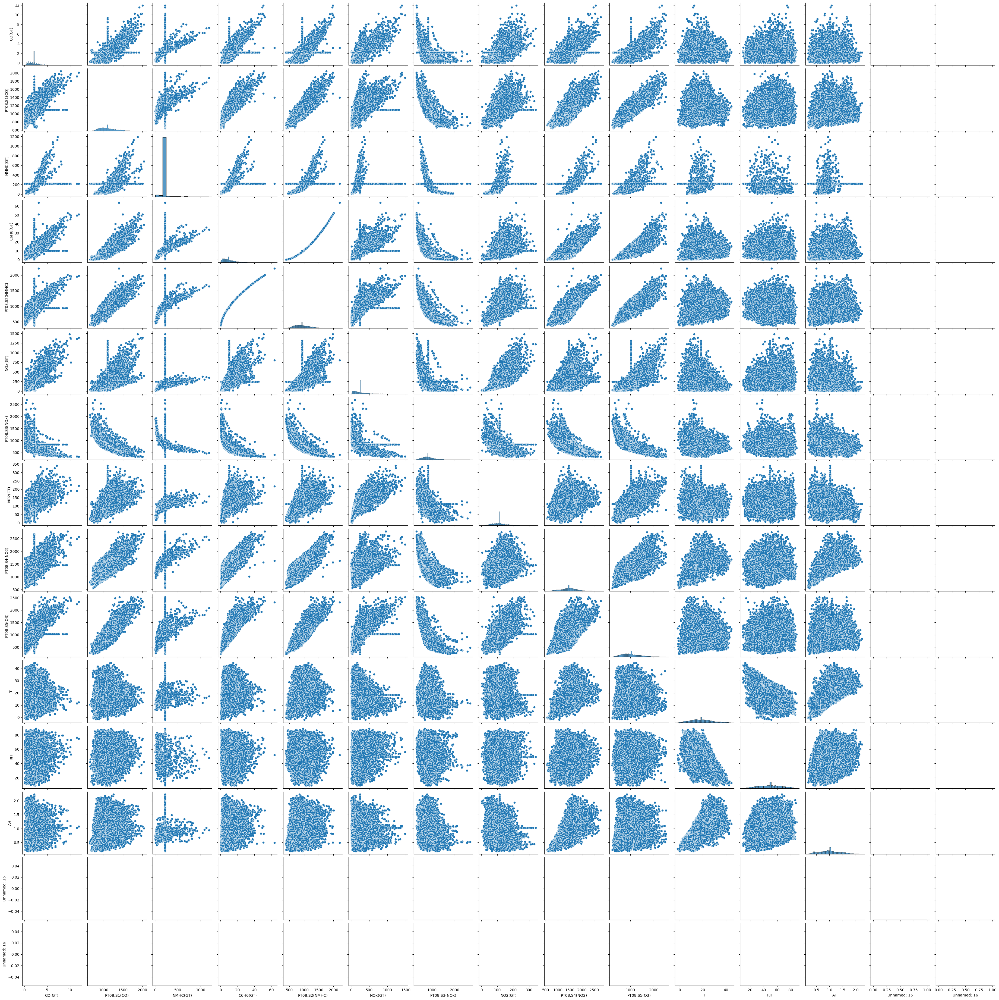

In [10]:
# sns.pairplot(air_quality[numeric_columns])
# plt.show()

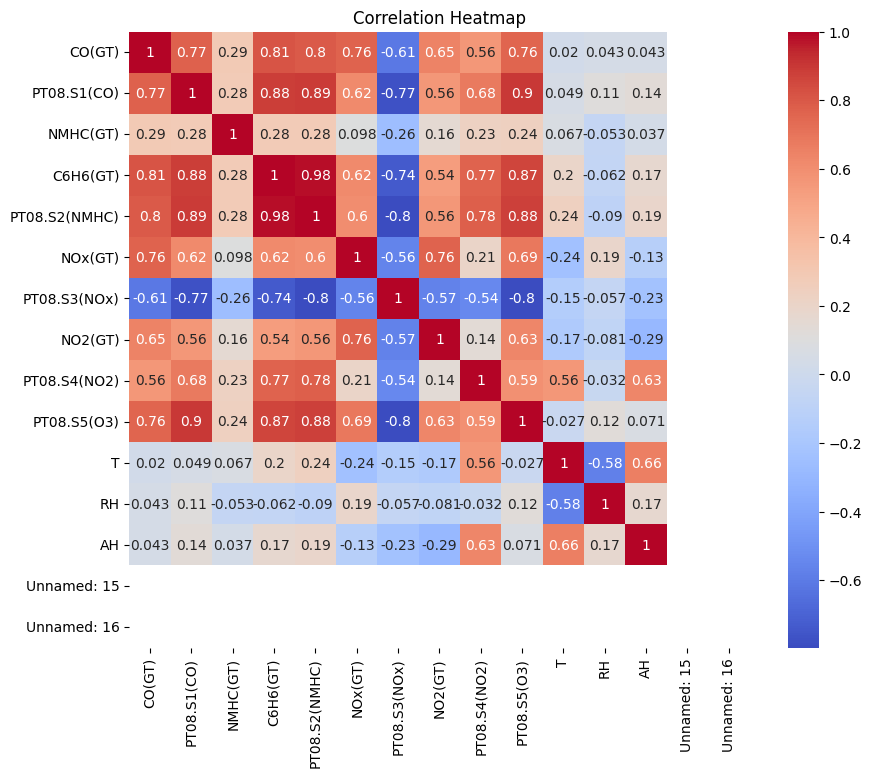

In [11]:
#Correlation heatmap
plt.figure(figsize=(10, 8))
correlation_matrix= air_quality[numeric_columns].corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Heatmap')
plt.show()

In [12]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score

In [13]:
# Define features and target variable
X = air_quality.drop(columns=['CO(GT)'])
y = air_quality['CO(GT)']


In [14]:
# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


In [15]:
# Replace -200 with NaN (assuming -200 is used for missing values)
air_quality = air_quality.replace(-200, np.nan)

# Replace missing values with the mean of each numeric column
numeric_columns = air_quality.select_dtypes(include=[np.number]).columns
air_quality[numeric_columns] = air_quality[numeric_columns].fillna(air_quality[numeric_columns].mean())

# Drop non-numeric columns if any
non_numeric_columns = air_quality.select_dtypes(exclude=[np.number]).columns
air_quality = air_quality.drop(columns=non_numeric_columns)

# Verify that non-numeric columns are dropped
print(air_quality.head())

# Define features and target variable
X = air_quality.drop(columns=['CO(GT)'])
y = air_quality['CO(GT)']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardize the data
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)


   CO(GT)  PT08.S1(CO)  NMHC(GT)  C6H6(GT)  PT08.S2(NMHC)  NOx(GT)  \
0     2.6       1360.0     150.0      11.9         1046.0    166.0   
1     2.0       1292.0     112.0       9.4          955.0    103.0   
2     2.2       1402.0      88.0       9.0          939.0    131.0   
3     2.2       1376.0      80.0       9.2          948.0    172.0   
4     1.6       1272.0      51.0       6.5          836.0    131.0   

   PT08.S3(NOx)  NO2(GT)  PT08.S4(NO2)  PT08.S5(O3)     T    RH      AH  \
0        1056.0    113.0        1692.0       1268.0  13.6  48.9  0.7578   
1        1174.0     92.0        1559.0        972.0  13.3  47.7  0.7255   
2        1140.0    114.0        1555.0       1074.0  11.9  54.0  0.7502   
3        1092.0    122.0        1584.0       1203.0  11.0  60.0  0.7867   
4        1205.0    116.0        1490.0       1110.0  11.2  59.6  0.7888   

   Unnamed: 15  Unnamed: 16  
0          NaN          NaN  
1          NaN          NaN  
2          NaN          NaN  
3       

/usr/local/lib/python3.10/dist-packages/sklearn/utils/extmath.py:1047: RuntimeWarning: invalid value encountered in divide
  updated_mean = (last_sum + new_sum) / updated_sample_count
/usr/local/lib/python3.10/dist-packages/sklearn/utils/extmath.py:1052: RuntimeWarning: invalid value encountered in divide
  T = new_sum / new_sample_count
/usr/local/lib/python3.10/dist-packages/sklearn/utils/extmath.py:1072: RuntimeWarning: invalid value encountered in divide
  new_unnormalized_variance -= correction**2 / new_sample_count


In [16]:
# Standardize the data
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

/usr/local/lib/python3.10/dist-packages/sklearn/utils/extmath.py:1047: RuntimeWarning: invalid value encountered in divide
  updated_mean = (last_sum + new_sum) / updated_sample_count
/usr/local/lib/python3.10/dist-packages/sklearn/utils/extmath.py:1052: RuntimeWarning: invalid value encountered in divide
  T = new_sum / new_sample_count
/usr/local/lib/python3.10/dist-packages/sklearn/utils/extmath.py:1072: RuntimeWarning: invalid value encountered in divide
  new_unnormalized_variance -= correction**2 / new_sample_count


In [17]:
#drop column 'Unnamed 15' and 'Unnamed 16'
air_quality = air_quality.drop(columns=['Unnamed: 15', 'Unnamed: 16'])


In [18]:
air_quality.tail()

,CO(GT),PT08.S1(CO),NMHC(GT),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH
9466,2.15275,1099.833166,218.811816,10.083105,939.153376,246.896735,835.493605,113.091251,1456.264598,1022.906128,18.317829,49.234201,1.02553
9467,2.15275,1099.833166,218.811816,10.083105,939.153376,246.896735,835.493605,113.091251,1456.264598,1022.906128,18.317829,49.234201,1.02553
9468,2.15275,1099.833166,218.811816,10.083105,939.153376,246.896735,835.493605,113.091251,1456.264598,1022.906128,18.317829,49.234201,1.02553
9469,2.15275,1099.833166,218.811816,10.083105,939.153376,246.896735,835.493605,113.091251,1456.264598,1022.906128,18.317829,49.234201,1.02553
9470,2.15275,1099.833166,218.811816,10.083105,939.153376,246.896735,835.493605,113.091251,1456.264598,1022.906128,18.317829,49.234201,1.02553


In [19]:
from sklearn.impute import SimpleImputer

In [20]:
# Drop non-numeric columns
non_numeric_columns = air_quality.select_dtypes(exclude=[np.number]).columns
air_quality = air_quality.drop(columns=non_numeric_columns)



In [21]:
#Repalce NaN with mean value of columns
numeric_columns = air_quality.select_dtypes(include=[np.number]).columns
air_quality[numeric_columns] = air_quality[numeric_columns].fillna(air_quality[numeric_columns].mean())

In [22]:
# Ensure no NaN values remain using SimpleImputer
imputer = SimpleImputer(strategy='mean')
air_quality[numeric_columns] = imputer.fit_transform(air_quality[numeric_columns])



In [23]:
#show rows where value = NaN
air_quality[numeric_columns].isnull().sum()

CO(GT)           0
PT08.S1(CO)      0
NMHC(GT)         0
C6H6(GT)         0
PT08.S2(NMHC)    0
NOx(GT)          0
PT08.S3(NOx)     0
NO2(GT)          0
PT08.S4(NO2)     0
PT08.S5(O3)      0
T                0
RH               0
AH               0
dtype: int64

# **Linear Regression**

In [27]:
# # Train a Linear Regression model
# model = LinearRegression()
# model.fit(X_train, y_train)

from sklearn.impute import SimpleImputer
from sklearn.linear_model import LinearRegression
# Create an imputer object to replace missing values with the mean
imputer = SimpleImputer(strategy='mean')

# Impute the training data
X_train_filled = imputer.fit_transform(X_train)

# Train the model with the imputed
model= LinearRegression()
model.fit(X_train_filled, y_train)

LinearRegression()

In [28]:
# Make predictions
# y_pred = model.predict(X_test)
y_pred = model.predict(imputer.transform(X_test))


In [29]:
# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

In [30]:
print(f'Mean Squared Error: {mse}')
print(f'R^2 Score: {r2}')


Mean Squared Error: 0.33347524920671306
R^2 Score: 0.8112999326647208


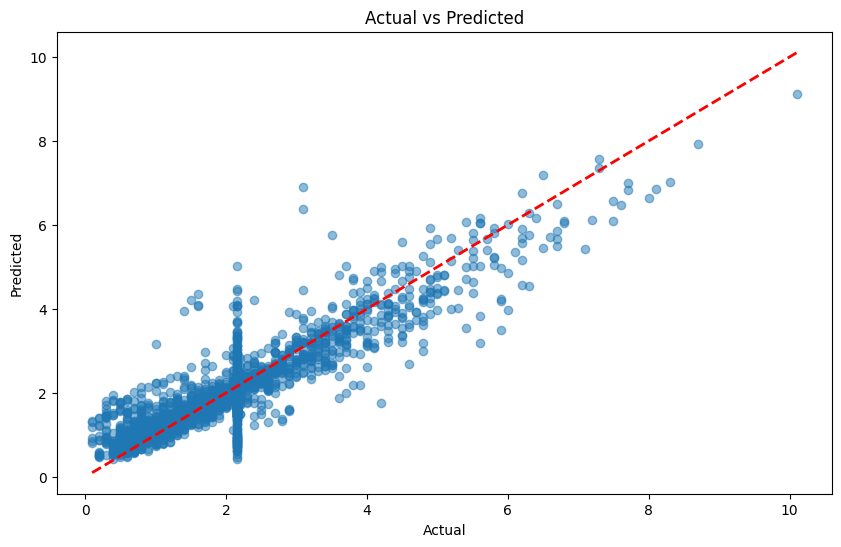

In [31]:
# Plot actual vs predicted values
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred, alpha=0.5)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', lw=2)
plt.xlabel('Actual')
plt.ylabel('Predicted')
plt.title('Actual vs Predicted')
plt.show()


In [32]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.linear_model import Lasso
from sklearn.metrics import mean_squared_error, r2_score


In [33]:
# Standardize the data
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)


/usr/local/lib/python3.10/dist-packages/sklearn/utils/extmath.py:1047: RuntimeWarning: invalid value encountered in divide
  updated_mean = (last_sum + new_sum) / updated_sample_count
/usr/local/lib/python3.10/dist-packages/sklearn/utils/extmath.py:1052: RuntimeWarning: invalid value encountered in divide
  T = new_sum / new_sample_count
/usr/local/lib/python3.10/dist-packages/sklearn/utils/extmath.py:1072: RuntimeWarning: invalid value encountered in divide
  new_unnormalized_variance -= correction**2 / new_sample_count


# **Lasso Regression**

In [34]:
#Lasso Regession Training
#Impute the training data
X_train_filled= imputer.fit_transform(X_train)

#Train the Lasso model
model= Lasso(alpha=0.1)
model.fit(X_train_filled, y_train)


Lasso(alpha=0.1)

In [35]:
#Making Prediction
y_pred = model.predict(imputer.transform(X_test))


In [36]:
#Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

In [37]:
print(f'Mean Squared Error: {mse}')
print(f'R^2 Score: {r2}')

Mean Squared Error: 0.3907790781083827
R^2 Score: 0.7788740287991793


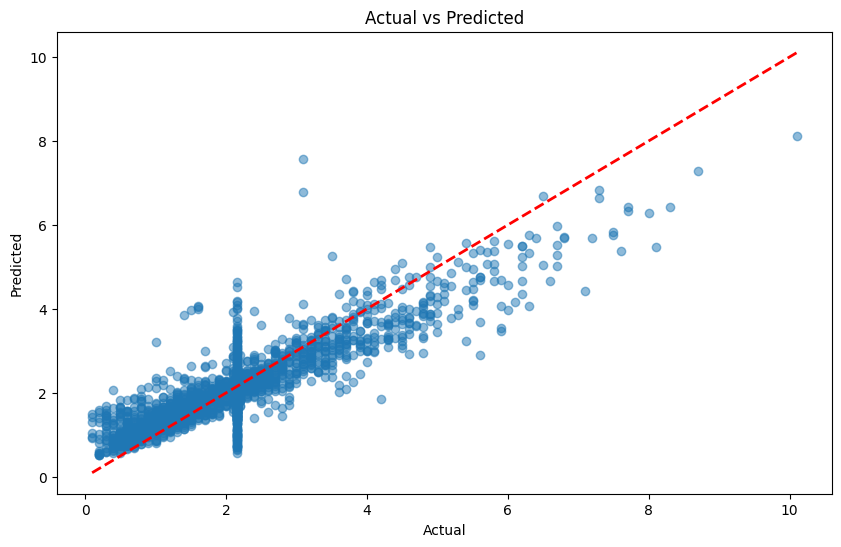

In [38]:
#Actual vs Predicted values
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred, alpha=0.5)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', lw=2)
plt.xlabel('Actual')
plt.ylabel('Predicted')
plt.title('Actual vs Predicted')
plt.show()

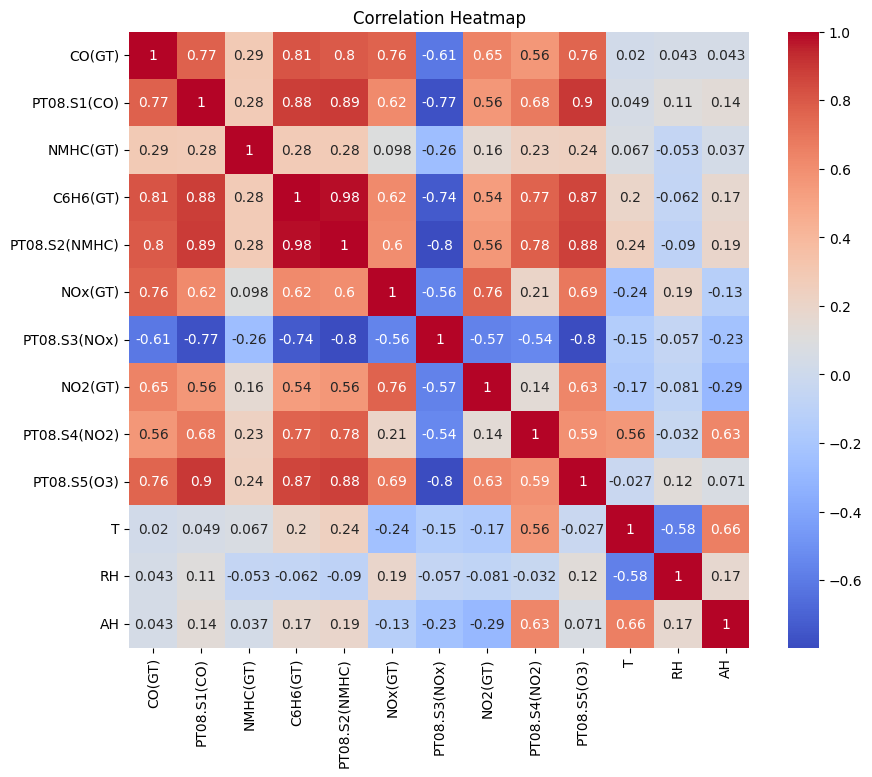

In [39]:
#Heatmap
plt.figure(figsize=(10, 8))
correlation_matrix= air_quality[numeric_columns].corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Heatmap')
plt.show()

# **Decision Tree**

In [40]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import mean_squared_error, r2_score



In [41]:
# Create a decision tree regressor
model = DecisionTreeRegressor(max_depth=5)

In [44]:
# Train the model
model.fit(X_train_filled, y_train)


DecisionTreeRegressor(max_depth=5)

In [47]:
# Impute test data (ensure consistency with training data)
X_test_filled = imputer.transform(X_test)

In [48]:
# Make predictions
y_pred = model.predict(X_test_filled)

In [49]:
# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
print(f'Mean Squared Error: {mse}')
print(f'R^2 Score: {r2}')

Mean Squared Error: 0.4153703479657383
R^2 Score: 0.7649588303279831


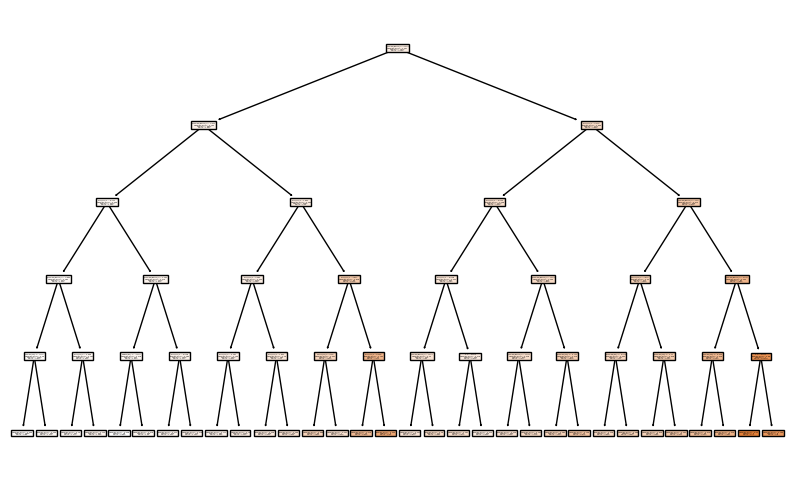

In [50]:
# Plot the decision tree
from sklearn.tree import plot_tree
plt.figure(figsize=(10, 6))
plot_tree(model, feature_names=X.columns, filled=True)
plt.show()


In [51]:
from sklearn.ensemble import RandomForestRegressor


In [52]:
# Create a Random Forest regressor
model = RandomForestRegressor(n_estimators=100, random_state=42)

In [54]:
# Train the model
model.fit(X_train_filled, y_train)

RandomForestRegressor(random_state=42)

In [55]:
# Make predictions
y_pred = model.predict(X_test_filled)

In [56]:
# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
print(f'Mean Squared Error: {mse}')
print(f'R^2 Score: {r2}')

Mean Squared Error: 0.2844734898907314
R^2 Score: 0.8390280333392662


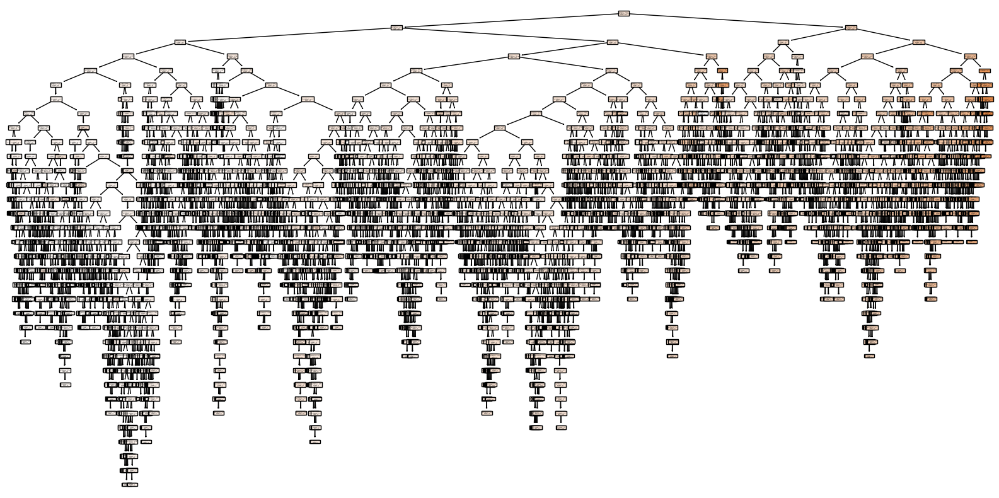

In [58]:
import matplotlib.pyplot as plt
from sklearn.tree import plot_tree

# Extract a single tree from the forest
estimator = model.estimators_[0]

# Plot the tree
plt.figure(figsize=(20,10))
plot_tree(estimator, feature_names=X.columns, filled=True)
plt.show()


In [61]:
from sklearn.svm import SVR
# Create an SVR regressor
model = SVR(kernel='rbf')

In [62]:
# Train the model
model.fit(X_train_filled, y_train)

SVR()

In [63]:
# Make predictions
y_pred = model.predict(X_test_filled)

In [64]:
# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
print(f'Mean Squared Error: {mse}')
print(f'R^2 Score: {r2}')

Mean Squared Error: 0.27004858163235373
R^2 Score: 0.8471905016667847


In [67]:
# Sample data (replace with your actual spam data)
data = {
    'message': ['buy now!', 'meeting at 3pm', 'free offer!', 'project update', 'urgent reply needed'],
    'spam': [1, 0, 1, 0, 1]  # 1 for spam, 0 for not spam
}
df = pd.DataFrame(data)



In [68]:
# Split data
X = df['message']  # Assuming 'message' is your feature column
y = df['spam']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


In [73]:
from sklearn.svm import SVC
from sklearn.metrics import confusion_matrix
from sklearn.feature_extraction.text import TfidfVectorizer
# Create a TfidfVectorizer object
vectorizer = TfidfVectorizer()

# Transform the training data into numerical features
X_train_features = vectorizer.fit_transform(X_train)


In [75]:
# Train SVM model
model = SVC(kernel='linear')
X_train_features = vectorizer.transform(X_train)
model.fit(X_train_features, y_train)

SVC(kernel='linear')

In [77]:
# Predict on test data
X_test_features = vectorizer.transform(X_test)
y_pred = model.predict(X_test_features)


In [78]:
# Create confusion matrix
cm = confusion_matrix(y_test, y_pred)

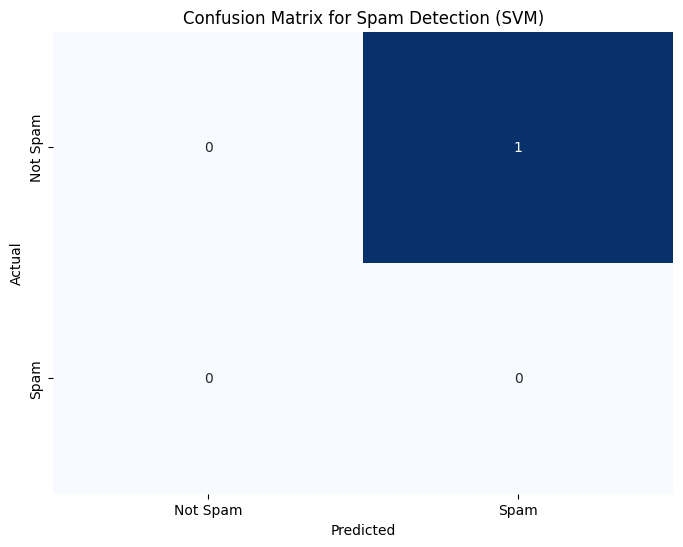

In [79]:
# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False,
            xticklabels=['Not Spam', 'Spam'], yticklabels=['Not Spam', 'Spam'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix for Spam Detection (SVM)')
plt.show()